# GAAE Latent Space Visualizer

Encodes all MCI subjects (converters + stable MCI) through a trained GAAE encoder,  
pool the node embeddings per graph, then visualise with **UMAP** coloured by diagnosis.

If converters and stable MCI cluster separately → a simple logistic-regression head will work well.  
If they overlap heavily → the encoder has not learned conversion-relevant features and joint fine-tuning is needed.

In [1]:
# papermill-injected parameters (overridden at runtime by run_experiment.py)
EXPERIMENT_ID       = 'gaae-latent-experiment'
MODE                = 'static'
MODEL               = 'GAAE'
DATASET             = 'DELCODE_WHOLE_BRAIN'
SEED                = 42
RESOLVED_CONFIG     = {}
RUN_DIR             = None
RUN_NAME            = None
WANDB_ENABLED       = False
ADAPTER             = 'gaae'
GAAE_CHECKPOINT_PATH = None
THRESHOLD_MODE      = None
FIXED_THRESHOLD     = None
OUTPUT_DIR          = 'outputs/gaae-latent-experiment'


In [2]:
# Parameters
EXPERIMENT_ID = "gaae-latent-experiment"
MODE = "static"
MODEL = "GAAE"
DATASET = "DELCODE_WHOLE_BRAIN"
SEED = 42
GAAE_CHECKPOINT_PATH = None
THRESHOLD_MODE = None
FIXED_THRESHOLD = None
WANDB_ENABLED = True
OUTPUT_DIR = "outputs/gaae-latent-experiment"
RESOLVED_CONFIG = {"seed": 100, "batch_size": 64, "learning_rate": 0.001, "weight_decay": 0.001, "adj_loss_weight": 0.2, "epochs": 500, "early_stopping_patience": 25, "latent_dim": 64, "hidden_dim": 128, "num_heads": 2, "cond_dim": 2, "dropout": 0.3, "adjacency_k": 16, "num_workers": 8, "file_variant": "z_transformed"}
RUN_DIR = "/mnt/e/fyassine/ad-early-detection/CLASSIFIER/outputs/gaae-latent-experiment/runs/ruby-mist-5-nogit-2026-06-25_11-21-17"
RUN_NAME = "ruby-mist-5-nogit-2026-06-25_11-21-17"
ADAPTER = "gaae"


In [3]:
import os
import sys
import json
from pathlib import Path

import numpy as np
import pandas as pd
import torch
from torch_geometric.loader import DataLoader

base_dir = Path('/mnt/e/fyassine/ad-early-detection/CLASSIFIER')
sys.path.insert(0, str(base_dir))
sys.path.insert(0, str(base_dir.parent))  # repo root → enables 'import SHARED'

from model.GAAE.models import GraphAttentionAutoencoderConditioned
from model.GAAE.dataset import GraphDatasetInMemoryFiltered
from model.GAAE.utils import knn_binary_adjacency_matrix_no_diag
from SHARED.seeding import set_seed, make_rng, make_torch_generator, seed_worker
from SHARED.provenance import region_from_data_root

print('Imports OK')

/tmp/ipykernel_1961573/3306850458.py:7: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Imports OK


In [4]:
# v2 reproducibility seeding — must run before datasets, samplers, or models.
SEED = 42
set_seed(SEED)
rng = make_rng(SEED)
torch_gen = make_torch_generator(SEED)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Device: cuda


## Configuration

In [5]:
import sys
if '/mnt/e/fyassine/ad-early-detection' not in sys.path:
    sys.path.insert(0, '/mnt/e/fyassine/ad-early-detection')
from DATA.src.splitting.load_splits import splits_dir, split_csv_paths

RANDOM_STATE = 42
set_seed(RANDOM_STATE)

# ── Data paths ──────────────────────────────────────────────────────────────
# Single source of truth for the data version — bump this one line on a data refresh.
DATA_VERSION = '__fc_wholebrain_sch200_flat__'
_DELCODE_ROOT = f'/mnt/e/fyassine/ad-early-detection/DATA/DELCODE/{DATA_VERSION}'
WB_DATA_ROOT = os.path.join(_DELCODE_ROOT, 'matrices')
METADATA_DIR = os.path.join(_DELCODE_ROOT, 'metadata')

# ── Which cohorts to include in the UMAP ───────────────────────────────────
# 'mci_only'  -> stable MCI vs converter only (downstream split)
# 'all'       -> healthy + AD + MCI + converter (pretrain split)
COHORT_MODE = 'mci_only'

# Split CSVs — 'mci_only' uses the downstream (mci/converter) split that every
# downstream classifier (GEC, GELSTM, Long-GEC-MLP, LogReg) is trained/evaluated
# on; 'all' uses the pretrain (all-cohort) split GAAE itself was trained on.
SPLITS_DIR = str(splits_dir('downstream' if COHORT_MODE == 'mci_only' else 'pretrain'))
TRAIN_CSV = os.path.join(SPLITS_DIR, 'train.csv')
VAL_CSV   = os.path.join(SPLITS_DIR, 'val.csv')
TEST_CSV  = os.path.join(SPLITS_DIR, 'test.csv')
# Merged patient-info CSV (sex/age lookup for GraphDatasetInMemoryFiltered)
ALL_SPLITS_CSV = os.path.join(SPLITS_DIR, '_all_splits_patient_info.csv')

# Brain region / atlas parsed from the DATA directory name.
DATA_INFO = region_from_data_root(WB_DATA_ROOT)
REGION    = DATA_INFO['region']
print(f"Input data: region={DATA_INFO['region']}  atlas={DATA_INFO['atlas']}  ({DATA_INFO['dataset_dir']})")

# ── Checkpoint search ───────────────────────────────────────────────────────
CHECKPOINT_SEARCH_DIRS = [
    str(base_dir / 'notebooks' / 'checkpoints' / 'checkpoints_gaae_whole_brain'),
    str(base_dir / 'notebooks' / 'checkpoints' / 'checkpoints_gaae_dmn'),
]

# ── Model hyper-params (must match the checkpoint) ─────────────────────────
CONFIG_PATH = base_dir / 'configs' / 'gaae_delcode_whole_brain.json'

# ── Visualisation ───────────────────────────────────────────────────────────
GRAPH_POOL  = 'mean'        # 'mean' | 'max' | 'sum'
UMAP_N_NEIGHBORS = 15
UMAP_MIN_DIST    = 0.1

print('Config set.')

Input data: region=wholebrain  atlas=sch200  (__fc_wholebrain_sch200_flat__)
Config set.


## Choose checkpoint

In [6]:
from common.checkpoints import select_gaae_checkpoint

# When GAAE_CHECKPOINT_PATH is injected by run_experiment.py, use it directly.
# Otherwise auto-select the latest (most recently dated) checkpoint so the
# notebook can run non-interactively under papermill.
_ckpt_override = GAAE_CHECKPOINT_PATH if 'GAAE_CHECKPOINT_PATH' in dir() and GAAE_CHECKPOINT_PATH else None

if _ckpt_override:
    SELECTED_NAME, _ckpt_path, SELECTED_RUN_DIR = select_gaae_checkpoint(
        CHECKPOINT_SEARCH_DIRS,
        checkpoint_path=_ckpt_override,
    )
else:
    # Auto-select: sort candidates by name (which includes the timestamp) and
    # take the last one (most recent run).
    from pathlib import Path as _Path
    _candidates = sorted(
        [
            (run_dir.name, run_dir / f'model_{run_dir.name}.pth', run_dir)
            for ckpt_dir in CHECKPOINT_SEARCH_DIRS
            for run_dir in sorted(_Path(ckpt_dir).iterdir())
            if _Path(ckpt_dir).is_dir() and run_dir.is_dir()
            if (run_dir / f'model_{run_dir.name}.pth').exists()
        ],
        key=lambda x: x[0],
    )
    if not _candidates:
        raise FileNotFoundError(f'No GAAE checkpoints found in: {CHECKPOINT_SEARCH_DIRS}')
    SELECTED_NAME, _ckpt_path, SELECTED_RUN_DIR = _candidates[-1]  # latest by name
    print(f'Auto-selected latest checkpoint: {SELECTED_NAME}')

CKPT_PATH = str(_ckpt_path)
print(f'Selected: {SELECTED_NAME}')


Auto-selected latest checkpoint: rustic-totem-1-gaae-static-2026-06-24_00-39-03_2026-06-24_00-47-44
Selected: rustic-totem-1-gaae-static-2026-06-24_00-39-03_2026-06-24_00-47-44


## Load model

In [7]:
if CONFIG_PATH.exists():
    with open(CONFIG_PATH) as f:
        hp = json.load(f)
    print('Config loaded from', CONFIG_PATH)
else:
    hp = dict(latent_dim=64, num_heads=2, cond_dim=2, dropout=0.3,
              adjacency_k=8, file_variant='z_transformed')
    print('Config not found - using defaults:', hp)

ADJACENCY_ARGS = {'k': hp.get('adjacency_k', 8)}
FILE_VARIANT   = hp.get('file_variant', 'z_transformed')
GAAE_LATENT    = hp.get('latent_dim', 64)

_probe_ds = GraphDatasetInMemoryFiltered(
    root=WB_DATA_ROOT,
    adjacency_function=knn_binary_adjacency_matrix_no_diag,
    adjacency_args=ADJACENCY_ARGS,
    filter_csv_path=TEST_CSV,
    separator=',',
    file_variant=FILE_VARIANT,
)
in_features = _probe_ds[0].x.size(1)

from model.GAAE.utils import load_gaae_for_inference
model = load_gaae_for_inference(
    ckpt_path=Path(CKPT_PATH),
    in_features=in_features,
    config=hp,
    device=device,
)
print('Model ready - encoder latent dim:', GAAE_LATENT)


Config loaded from /mnt/e/fyassine/ad-early-detection/CLASSIFIER/configs/gaae_delcode_whole_brain.json


Model ready - encoder latent dim: 64


## Build dataset

We merge the three split CSVs and optionally restrict to MCI subjects only.

In [8]:
import tempfile

train_df = pd.read_csv(TRAIN_CSV)
val_df   = pd.read_csv(VAL_CSV)
test_df  = pd.read_csv(TEST_CSV)
subset_df = pd.concat([train_df, val_df, test_df], ignore_index=True)

print(f'Cohort mode: {COHORT_MODE}')
print(subset_df['diagnosis'].value_counts())

# Write a temporary CSV so GraphDatasetInMemoryFiltered can use it as a filter
_tmp_csv = tempfile.NamedTemporaryFile(suffix='.csv', delete=False, mode='w')
subset_df.to_csv(_tmp_csv.name, index=False)
_tmp_csv.close()

# Build merged patient-info CSV once so GraphDatasetInMemoryFiltered
# can resolve sex/age and stop logging 'not found in metadata' warnings.
if not os.path.exists(ALL_SPLITS_CSV):
    _all_info = pd.concat(
        [train_df[['Pseudonym','sex','age']],
         val_df[['Pseudonym','sex','age']],
         test_df[['Pseudonym','sex','age']]],
        ignore_index=True,
    ).drop_duplicates('Pseudonym').reset_index(drop=True)
    _all_info.to_csv(ALL_SPLITS_CSV, index=False)
    print(f'Wrote patient-info CSV: {ALL_SPLITS_CSV}')

dataset = GraphDatasetInMemoryFiltered(
    root=WB_DATA_ROOT,
    adjacency_function=knn_binary_adjacency_matrix_no_diag,
    adjacency_args=ADJACENCY_ARGS,
    filter_csv_path=_tmp_csv.name,
    patient_info_path=ALL_SPLITS_CSV,
    separator=',',
    file_variant=FILE_VARIANT,
)
loader = DataLoader(dataset, batch_size=16, shuffle=False)

print(f'\nDataset size: {len(dataset)} scans from {subset_df["Pseudonym"].nunique()} subjects')

Cohort mode: mci_only
diagnosis
mci          99
converter    68
Name: count, dtype: int64


Processing...


Done!



Dataset size: 507 scans from 167 subjects


## Encode → graph-level embeddings

In [9]:
from model.GAAE.inference import extract_embeddings as _extract_emb

_raw_emb, all_patient_ids = _extract_emb(
    model, dataset, device, batch_size=32, graph_pool=GRAPH_POOL
)
embeddings = _raw_emb   # (N_scans, F)
print(f'Embeddings shape: {embeddings.shape}')


Embeddings shape: (507, 64)


## Attach diagnosis labels

In [10]:
id_to_diag = dict(zip(subset_df['Pseudonym'].astype(str), subset_df['diagnosis']))

# patient_ids list may have one entry per *scan* – extract the subject part
scan_ids  = [str(pid).split('_')[0] if '_' in str(pid) else str(pid) for pid in all_patient_ids]
labels    = [id_to_diag.get(sid, 'unknown') for sid in scan_ids]

meta_df = pd.DataFrame({
    'patient_id': scan_ids,
    'diagnosis':  labels,
})

print(meta_df['diagnosis'].value_counts())
print(f'Total scans: {len(meta_df)}')

diagnosis
mci          274
converter    233
Name: count, dtype: int64
Total scans: 507


## UMAP projection

In [11]:
try:
    import umap
except ImportError:
    raise ImportError('Run: pip install umap-learn')

reducer = umap.UMAP(
    n_neighbors=UMAP_N_NEIGHBORS,
    min_dist=UMAP_MIN_DIST,
    n_components=2,
    random_state=RANDOM_STATE,
    metric='euclidean',
)
embedding_2d = reducer.fit_transform(embeddings)
print(f'2-D embedding shape: {embedding_2d.shape}')

/mnt/e/fyassine/ad-early-detection/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


2-D embedding shape: (507, 2)


## Latent space plot

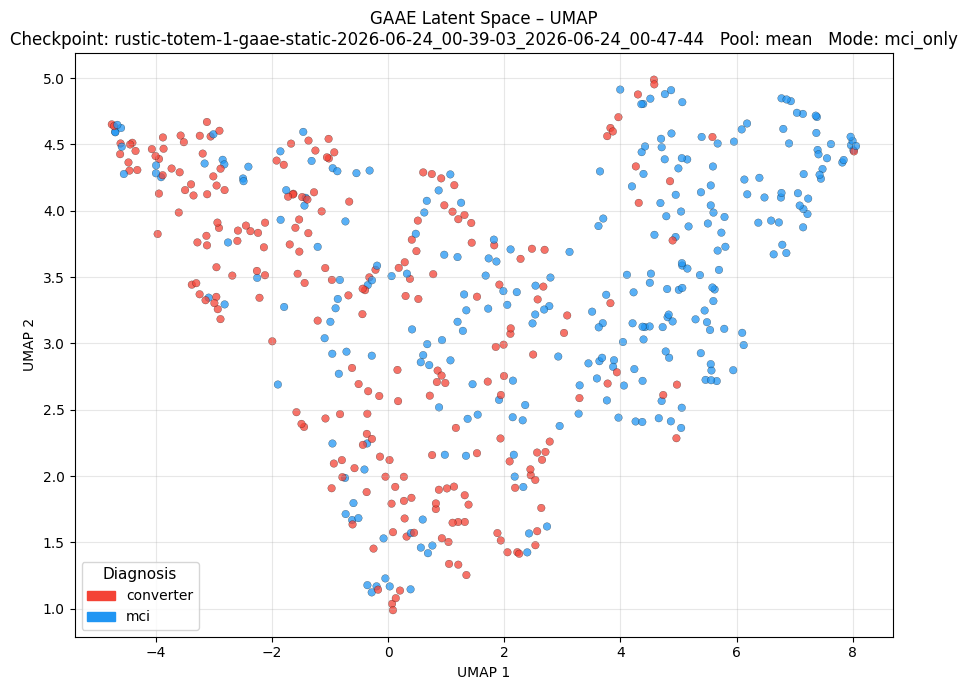

In [12]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

COLOR_MAP = {
    'healthy':   '#4CAF50',
    'mci':       '#2196F3',
    'converter': '#F44336',
    'ad':        '#9C27B0',
    'unknown':   '#9E9E9E',
}

unique_labels = sorted(set(labels))
colors = [COLOR_MAP.get(l, '#9E9E9E') for l in labels]

fig, ax = plt.subplots(figsize=(9, 7))
ax.scatter(
    embedding_2d[:, 0], embedding_2d[:, 1],
    c=colors, alpha=0.75, s=30, edgecolors='k', linewidths=0.2,
)

patches = [mpatches.Patch(color=COLOR_MAP.get(l, '#9E9E9E'), label=l) for l in unique_labels]
ax.legend(handles=patches, title='Diagnosis', fontsize=10, title_fontsize=11)

ax.set_title(
    f'GAAE Latent Space – UMAP\n'
    f'Checkpoint: {SELECTED_NAME}   Pool: {GRAPH_POOL}   Mode: {COHORT_MODE}',
    fontsize=12,
)
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Logistic regression probe

Train a simple logistic regression **on the raw latent embeddings** (not the 2-D UMAP)  
to get a quantitative separability score for **converter vs stable MCI**.

In [13]:
from model.classification.logreg_cv import train_logreg_cv

# Keep only MCI / converter scans for binary classification
mask        = np.array([l in ('mci', 'converter') for l in labels])
X_bin       = embeddings[mask]
y_bin       = np.array([1 if labels[i] == 'converter' else 0
                        for i in range(len(labels)) if mask[i]])
groups_bin  = np.array([scan_ids[i] for i in range(len(scan_ids)) if mask[i]])

print(f'Binary classification:  converter={y_bin.sum()}  stable_mci={(1-y_bin).sum()}')

n_splits = min(5, len(np.unique(groups_bin)))
result = train_logreg_cv(X_bin, y_bin, groups_bin, n_folds=n_splits, seed=SEED)

for fold, auc in enumerate(result.fold_aucs, 1):
    print(f'Fold {fold}: AUC = {auc:.3f}')
print(f'\nMean AUC: {np.mean(result.fold_aucs):.3f} \u00b1 {np.std(result.fold_aucs):.3f}')

# Keep cv object for ROC re-run cell below
from sklearn.model_selection import StratifiedGroupKFold
cv = StratifiedGroupKFold(n_splits=n_splits)


Binary classification:  converter=233  stable_mci=274


Fold 1: AUC = 0.807
Fold 2: AUC = 0.781
Fold 3: AUC = 0.726
Fold 4: AUC = 0.773
Fold 5: AUC = 0.793

Mean AUC: 0.776 ± 0.028


## ROC curve (last fold)

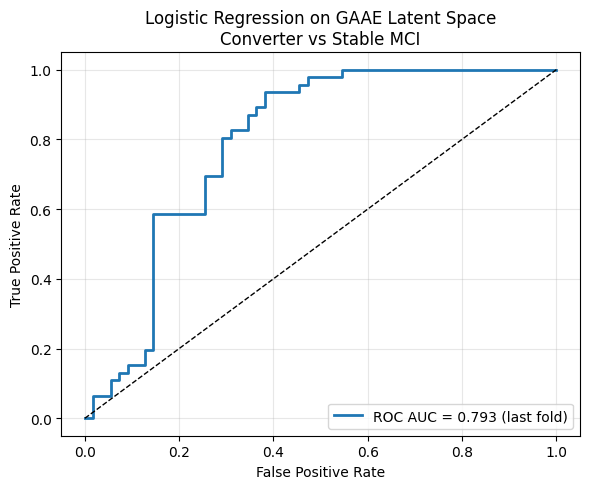

In [14]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Re-run last fold to get probability values
tr_idx_last, te_idx_last = list(cv.split(X_bin, y_bin, groups=groups_bin))[-1]
sc_last  = StandardScaler().fit(X_bin[tr_idx_last])
clf_last = LogisticRegression(max_iter=1000, C=1.0, class_weight='balanced')
clf_last.fit(sc_last.transform(X_bin[tr_idx_last]), y_bin[tr_idx_last])
prob_last = clf_last.predict_proba(sc_last.transform(X_bin[te_idx_last]))[:, 1]

fpr, tpr, _ = roc_curve(y_bin[te_idx_last], prob_last)
auc_last    = roc_auc_score(y_bin[te_idx_last], prob_last)

fig, ax = plt.subplots(figsize=(6, 5))
ax.plot(fpr, tpr, lw=2, label=f'ROC AUC = {auc_last:.3f} (last fold)')
ax.plot([0, 1], [0, 1], 'k--', lw=1)
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('Logistic Regression on GAAE Latent Space\nConverter vs Stable MCI')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Bonus: UMAP coloured by visit number (longitudinal drift)

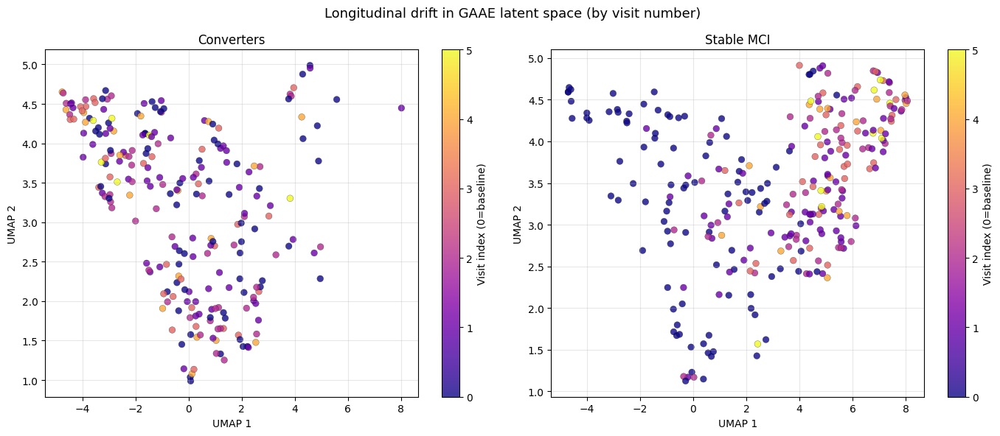

In [15]:
# Build visit index per subject using scan order
visit_counts = {}
visit_indices = []
for sid in scan_ids:
    visit_counts[sid] = visit_counts.get(sid, 0)
    visit_indices.append(visit_counts[sid])
    visit_counts[sid] += 1

visit_arr = np.array(visit_indices)

# Filter to MCI+converter only
vis_emb2d = embedding_2d[mask]
vis_idx   = visit_arr[mask]
vis_diag  = np.array(labels)[mask]

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for ax, (sub_mask, sub_label) in zip(
    axes,
    [('converter', 'Converters'), ('mci', 'Stable MCI')]
):
    m = vis_diag == sub_mask
    sc = ax.scatter(
        vis_emb2d[m, 0], vis_emb2d[m, 1],
        c=vis_idx[m], cmap='plasma', alpha=0.8, s=40,
        edgecolors='k', linewidths=0.2,
    )
    plt.colorbar(sc, ax=ax, label='Visit index (0=baseline)')
    ax.set_title(sub_label)
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    ax.grid(True, alpha=0.3)

fig.suptitle('Longitudinal drift in GAAE latent space (by visit number)', fontsize=13)
plt.tight_layout()
plt.show()

## Quantitative Separability — Silhouette Score

Silhouette measures how well each sample fits its own cluster vs the neighbouring cluster in the **full high-dimensional** latent space (not UMAP).

In [16]:
from sklearn.metrics import silhouette_score

# MCI-only cohort (converter vs stable)
mci_mask = np.array([l in ('mci','converter') for l in labels])
X_sil = embeddings[mci_mask]
y_sil = np.array([1 if l == 'converter' else 0 for l in np.array(labels)[mci_mask]])

sil_mci = silhouette_score(X_sil, y_sil, metric='euclidean')

def interpret_silhouette(s):
    if s > 0.5:  return 'Strong separation — embeddings encode conversion-relevant features'
    if s > 0.25: return 'Moderate separation — some class signal present'
    if s > 0.0:  return 'Weak separation — embeddings partially encode class signal'
    return 'Overlap / no separation — encoder has not learned conversion-relevant features'

print(f'Silhouette score (MCI only, full latent space): {sil_mci:.4f}')
print(f'Interpretation: {interpret_silhouette(sil_mci)}')

# All cohorts (for reference)
if COHORT_MODE == 'all':
    diag_int = np.array([{'healthy':0,'mci':1,'converter':2,'ad':3}.get(l,0) for l in labels])
    sil_all  = silhouette_score(embeddings, diag_int, metric='euclidean')
    print(f'Silhouette score (all cohorts):              {sil_all:.4f}')


Silhouette score (MCI only, full latent space): 0.0991
Interpretation: Weak separation — embeddings partially encode class signal


## Fisher's Discriminant Ratio per Latent Dimension

FDR_j = |μ_conv_j - μ_mci_j|² / (σ²_conv_j + σ²_mci_j) for each dimension j.

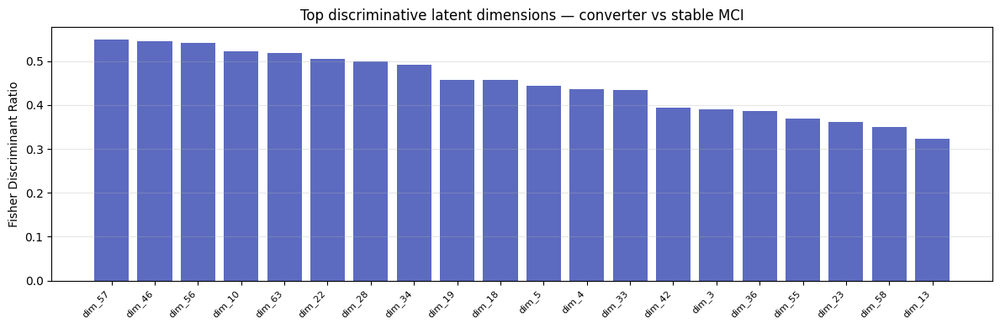

Top-5 discriminative dims: [57, 46, 56, 10, 63]
Max FDR: 0.5501   Mean FDR: 0.2337


In [17]:
conv_emb = embeddings[mci_mask & (np.array(labels) == 'converter')]
mci_emb  = embeddings[mci_mask & (np.array(labels) == 'mci')]

mu_conv = conv_emb.mean(axis=0)
mu_mci  = mci_emb.mean(axis=0)
var_conv = conv_emb.var(axis=0) + 1e-8
var_mci  = mci_emb.var(axis=0)  + 1e-8

fdr = (mu_conv - mu_mci) ** 2 / (var_conv + var_mci)
top_dims = np.argsort(fdr)[::-1]   # descending

fig, ax = plt.subplots(figsize=(12, 4))
n_show = min(20, len(fdr))
ax.bar(range(n_show), fdr[top_dims[:n_show]], color='#5C6BC0')
ax.set_xticks(range(n_show))
ax.set_xticklabels([f'dim_{i}' for i in top_dims[:n_show]], rotation=45, ha='right', fontsize=8)
ax.set_ylabel('Fisher Discriminant Ratio')
ax.set_title('Top discriminative latent dimensions — converter vs stable MCI')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.show()

print(f'Top-5 discriminative dims: {top_dims[:5].tolist()}')
print(f'Max FDR: {fdr[top_dims[0]]:.4f}   Mean FDR: {fdr.mean():.4f}')


## Per-Dimension Latent Distribution

Overlapping KDE plots for the top discriminative dimensions (ranked by FDR).

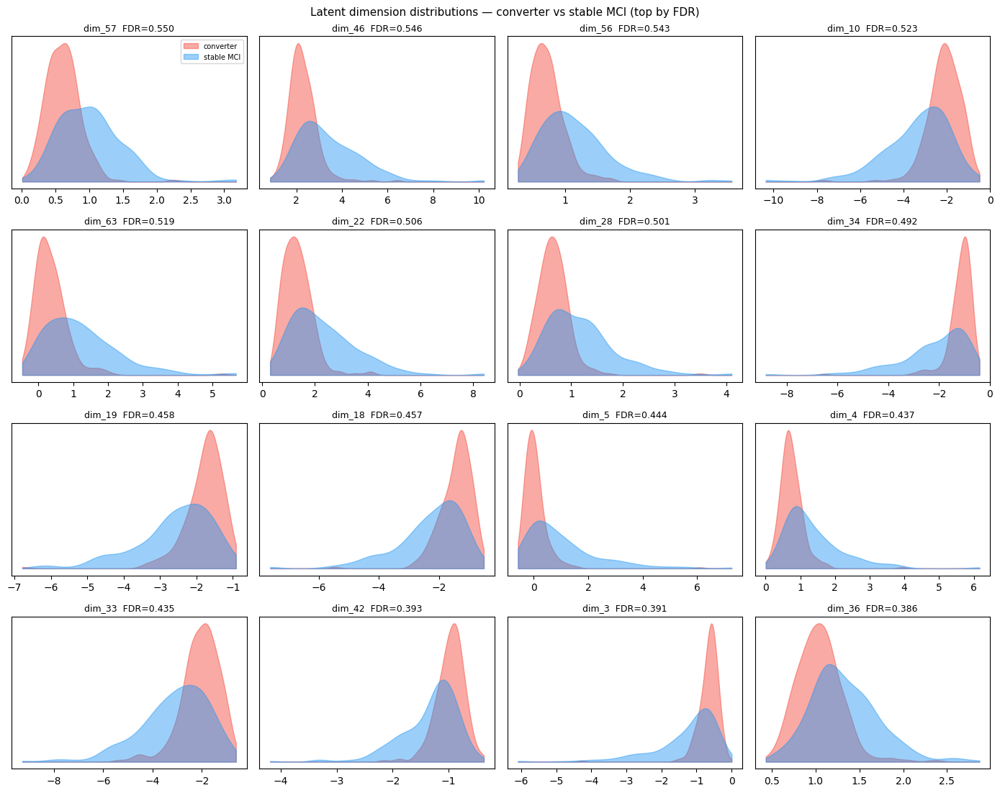

In [18]:
from scipy.stats import gaussian_kde

n_grid = min(16, embeddings.shape[1])
dims_to_plot = top_dims[:n_grid]

ncols = 4
nrows = (n_grid + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(14, nrows * 2.8))
axes_flat = axes.flatten()

for plot_i, dim_j in enumerate(dims_to_plot):
    ax = axes_flat[plot_i]
    vals_conv = conv_emb[:, dim_j]
    vals_mci  = mci_emb[:, dim_j]
    lo = min(vals_conv.min(), vals_mci.min())
    hi = max(vals_conv.max(), vals_mci.max())
    xs = np.linspace(lo, hi, 200)
    try:
        ax.fill_between(xs, gaussian_kde(vals_conv)(xs), alpha=0.45, color='#F44336', label='converter')
        ax.fill_between(xs, gaussian_kde(vals_mci)(xs),  alpha=0.45, color='#2196F3', label='stable MCI')
    except Exception:
        ax.hist(vals_conv, bins=20, alpha=0.5, color='#F44336', density=True, label='converter')
        ax.hist(vals_mci,  bins=20, alpha=0.5, color='#2196F3', density=True, label='stable MCI')
    ax.set_title(f'dim_{dim_j}  FDR={fdr[dim_j]:.3f}', fontsize=9)
    ax.set_yticks([])
    if plot_i == 0:
        ax.legend(fontsize=7)

for ax in axes_flat[n_grid:]:
    ax.set_visible(False)

fig.suptitle('Latent dimension distributions — converter vs stable MCI (top by FDR)', fontsize=11)
plt.tight_layout(); plt.show()


## GAT Attention Heatmap — Schaefer-200 Brain Atlas

Extract per-node attention weights from the last GAT encoder layer, average over subjects per cohort, and map onto Schaefer-200 ROI names.

In [19]:
# Load Schaefer-200 ROI labels (skip index 0 = Background)
try:
    from nilearn import datasets as nl_datasets
    _sch = nl_datasets.fetch_atlas_schaefer_2018(n_rois=200, yeo_networks=7, verbose=0)
    roi_labels = [
        (l.decode() if isinstance(l, bytes) else l)
        for l in _sch['labels'][1:]   # skip Background
    ]
    print(f'Loaded {len(roi_labels)} Schaefer-200 ROI labels')
except Exception as e:
    roi_labels = [f'ROI_{i}' for i in range(200)]
    print(f'nilearn not available ({e}), using numeric ROI labels')

# Colour map for Yeo 7 networks
NETWORK_COLORS = {
    'Vis':        '#9C27B0', 'SomMot':     '#2196F3',
    'DorsAttn':   '#4CAF50', 'SalVentAttn':'#FF9800',
    'Limbic':     '#795548', 'Cont':       '#F44336',
    'Default':    '#607D8B',
}

def get_network(roi_name):
    """Extract Yeo network abbreviation from Schaefer label string."""
    parts = roi_name.split('_')
    if len(parts) >= 3:
        return parts[2]   # e.g. '7Networks_LH_Vis_1' → 'Vis'
    return 'Unknown'


Loaded 200 Schaefer-200 ROI labels


In [20]:
# Extract attention weights per sample
conv_attn_sums = None
conv_counts    = 0
mci_attn_sums  = None
mci_counts     = 0

model.eval()
with torch.no_grad():
    for i in range(len(dataset)):
        sample = dataset[i]
        pid    = str(getattr(sample, 'patient_id', ''))
        diag   = id_to_diag.get(pid, 'unknown')
        if diag not in ('mci', 'converter'):
            continue

        x          = sample.x.to(device)
        edge_index = sample.edge_index.to(device)
        edge_attr  = sample.edge_attr
        if edge_attr is not None:
            edge_attr = edge_attr.to(device)

        _, attn_list = model.encode(x, edge_index, edge_attr, return_attention=True)
        # Last layer attention: (edge_index_out, attn_weights) where attn_weights is (E, H)
        _, attn_weights = attn_list[-1]
        if attn_weights.dim() == 1:
            attn_weights = attn_weights.unsqueeze(-1)
        attn_mean_over_heads = attn_weights.mean(dim=-1)  # (E,)

        # Aggregate per-node: mean attention of all edges pointing TO each node
        n_nodes = x.size(0)
        node_attn = torch.zeros(n_nodes, device=device)
        node_count = torch.zeros(n_nodes, device=device)
        dst_nodes  = edge_index[1]   # destination node index
        node_attn.scatter_add_(0, dst_nodes, attn_mean_over_heads)
        node_count.scatter_add_(0, dst_nodes, torch.ones_like(attn_mean_over_heads))
        node_attn = (node_attn / node_count.clamp(min=1)).cpu().numpy()

        # Pad/clip to 200 ROIs
        n_rois = min(len(node_attn), 200)
        arr = np.zeros(200)
        arr[:n_rois] = node_attn[:n_rois]

        if diag == 'converter':
            conv_attn_sums = arr if conv_attn_sums is None else conv_attn_sums + arr
            conv_counts += 1
        else:
            mci_attn_sums = arr if mci_attn_sums is None else mci_attn_sums + arr
            mci_counts += 1

conv_attn_mean = conv_attn_sums / max(conv_counts, 1)
mci_attn_mean  = mci_attn_sums  / max(mci_counts,  1)
attn_diff      = conv_attn_mean - mci_attn_mean

print(f'Processed {conv_counts} converter and {mci_counts} stable MCI samples')


Processed 233 converter and 274 stable MCI samples


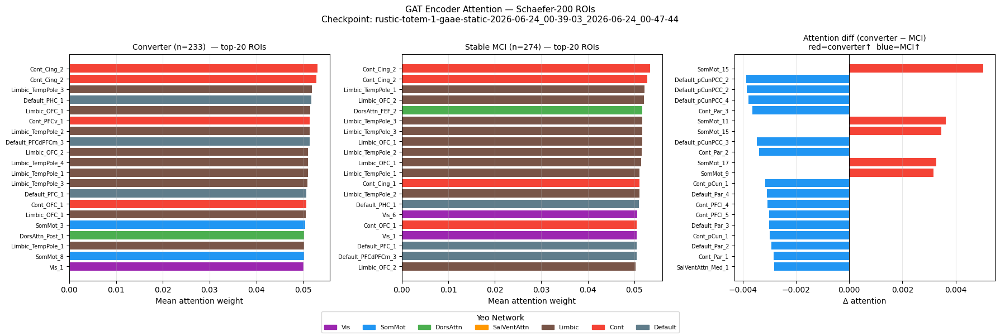

In [21]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
n_top = 20

def attn_barplot(ax, attn_vec, title, palette=None, highlight_diff=False):
    top_idx  = np.argsort(attn_vec)[::-1][:n_top]
    top_vals = attn_vec[top_idx]
    top_names = [roi_labels[i] if i < len(roi_labels) else f'ROI_{i}' for i in top_idx]
    nets      = [get_network(n) for n in top_names]
    colors    = [NETWORK_COLORS.get(net, '#9E9E9E') for net in nets]
    short_names = ['_'.join(n.split('_')[2:]) for n in top_names]  # strip '7Networks_LH_'
    ax.barh(range(n_top)[::-1], top_vals, color=colors)
    ax.set_yticks(range(n_top)[::-1])
    ax.set_yticklabels(short_names, fontsize=7)
    ax.set_title(title, fontsize=10)
    ax.set_xlabel('Mean attention weight')
    ax.grid(axis='x', alpha=0.3)

attn_barplot(axes[0], conv_attn_mean, f'Converter (n={conv_counts})  — top-20 ROIs')
attn_barplot(axes[1], mci_attn_mean,  f'Stable MCI (n={mci_counts}) — top-20 ROIs')

# Difference plot
diff_idx   = np.argsort(np.abs(attn_diff))[::-1][:n_top]
diff_vals  = attn_diff[diff_idx]
diff_names = ['_'.join((roi_labels[i] if i < len(roi_labels) else f'ROI_{i}').split('_')[2:])
              for i in diff_idx]
diff_cols  = ['#F44336' if v > 0 else '#2196F3' for v in diff_vals]
axes[2].barh(range(n_top)[::-1], diff_vals, color=diff_cols)
axes[2].set_yticks(range(n_top)[::-1])
axes[2].set_yticklabels(diff_names, fontsize=7)
axes[2].axvline(0, color='black', lw=0.8)
axes[2].set_title('Attention diff (converter − MCI)\nred=converter↑  blue=MCI↑', fontsize=10)
axes[2].set_xlabel('Δ attention')
axes[2].grid(axis='x', alpha=0.3)

# Legend for networks
from matplotlib.patches import Patch
handles = [Patch(color=c, label=n) for n, c in NETWORK_COLORS.items()]
fig.legend(handles=handles, title='Yeo Network', loc='lower center', ncol=7, fontsize=8)
fig.suptitle(f'GAT Encoder Attention — Schaefer-200 ROIs\nCheckpoint: {SELECTED_NAME}', fontsize=11)
plt.tight_layout(rect=[0, 0.06, 1, 1])
plt.show()


In [22]:
import glob, re

MATRICES_DIR = WB_DATA_ROOT

def get_visit_files(pid):
    """Return sorted list of (visit_months, filepath) for a subject."""
    suffix = {
        'z_transformed': '_whole_brain_correlation_matrix_z_transformed.npz',
        'raw':           '_whole_brain_correlation_matrix.npz',
    }.get(FILE_VARIANT, '_whole_brain_correlation_matrix_z_transformed.npz')
    pattern = os.path.join(MATRICES_DIR, f'sub-{pid}_*{suffix}')
    files = sorted(glob.glob(pattern))
    result = []
    for f in files:
        m = re.search(r'_(M\d+)_', os.path.basename(f))
        if m:
            result.append((int(m.group(1).replace('M','')), f))
    return sorted(result, key=lambda x: x[0])   # sort by visit month

# Find all subjects with their visit counts (from actual files)
visit_info = {}
for pid, diag in id_to_diag.items():
    if diag not in ('mci', 'converter'):
        continue
    vf = get_visit_files(pid)
    if vf:
        visit_info[pid] = {'diag': diag, 'visits': [v for v,_ in vf], 'files': [f for _,f in vf]}

# Find best matching pair: maximise min(n_conv_visits, n_mci_visits)
conv_subs = {pid: info for pid, info in visit_info.items() if info['diag']=='converter'}
mci_subs  = {pid: info for pid, info in visit_info.items() if info['diag']=='mci'}

best_pair = None
best_n    = 0
for cp, ci in conv_subs.items():
    for mp, mi in mci_subs.items():
        shared = sorted(set(ci['visits']) & set(mi['visits']))
        if len(shared) > best_n:
            best_n    = len(shared)
            best_pair = (cp, mp, shared)

if best_pair is None:
    raise RuntimeError('No matching visit pairs found between converter and MCI subjects.')

CONV_PID, MCI_PID, SHARED_VISITS = best_pair
print(f'Selected converter:  {CONV_PID}  visits={visit_info[CONV_PID]["visits"]}')
print(f'Selected stable MCI: {MCI_PID}  visits={visit_info[MCI_PID]["visits"]}')
print(f'Shared visits:       {SHARED_VISITS}  (n={best_n})')


Selected converter:  9cf012413  visits=[0, 12, 24, 36, 48, 60]
Selected stable MCI: 3e330542a  visits=[0, 12, 24, 36, 48, 60]
Shared visits:       [0, 12, 24, 36, 48, 60]  (n=6)


In [23]:
def load_graph(filepath):
    """Load NPZ → adjacency → PyG Data."""
    from model.GAAE.utils import knn_binary_adjacency_matrix_no_diag
    from torch_geometric.utils import dense_to_sparse
    arr = np.load(filepath)['array']
    arr = np.nan_to_num(arr, nan=0.0, posinf=0.0, neginf=0.0)
    feat = torch.tensor(arr, dtype=torch.float)
    adj  = knn_binary_adjacency_matrix_no_diag(torch.abs(feat), **ADJACENCY_ARGS)
    if isinstance(adj, np.ndarray):
        adj = torch.tensor(adj, dtype=torch.float32)
    ei, ew = dense_to_sparse(adj)
    from torch_geometric.data import Data
    return Data(x=feat, edge_index=ei, edge_attr=ew)

def encode_graph(data):
    """Encode a single graph → mean-pooled latent vector (F,)."""
    model.eval()
    with torch.no_grad():
        x  = data.x.to(device)
        ei = data.edge_index.to(device)
        ea = data.edge_attr.to(device) if data.edge_attr is not None else None
        z  = model.encode(x, ei, ea)     # (N_nodes, F)
        return z.mean(dim=0)             # (F,)

# Build visit-month → file maps
conv_files = {v: f for v, f in zip(visit_info[CONV_PID]['visits'], visit_info[CONV_PID]['files'])}
mci_files  = {v: f for v, f in zip(visit_info[MCI_PID]['visits'],  visit_info[MCI_PID]['files'])}


## Disease Axis Projection

Constructs the explicit **conversion direction** from logistic regression classifier weights — the direction in 64-D latent space that best separates converters from stable MCI. Unlike UMAP (which is unsupervised), this axis is guaranteed to align with the linear decision boundary.

**Only train+val subjects** are used for fitting (test subjects excluded to avoid leakage).

In [24]:
from sklearn.decomposition import PCA

# ── Restrict to train+val subjects (no test leakage) ───────────────────
train_val_ids = set(
    pd.concat([train_df, val_df])['Pseudonym'].astype(str).tolist()
)

# Build arrays: use existing X_bin/y_bin/groups_bin but filter to train+val
tv_mask   = np.array([sid in train_val_ids for sid in groups_bin])
X_tv      = X_bin[tv_mask]
y_tv      = y_bin[tv_mask]
scan_tv   = np.array([scan_ids[i] for i, keep in enumerate(
    [l in ('mci','converter') for l in labels]) if keep])[tv_mask]
labels_tv = np.array([labels[i] for i, keep in enumerate(
    [l in ('mci','converter') for l in labels]) if keep])[tv_mask]

print(f'Train+val scans for disease axis: '
      f'converter={y_tv.sum()}  stable_mci={(1-y_tv).sum()}')

# ── Fit full-data LR on train+val (for visualization only, not evaluation) ─
sc_full  = StandardScaler().fit(X_tv)
clf_full = LogisticRegression(max_iter=2000, C=1.0, class_weight='balanced',
                              random_state=42)
clf_full.fit(sc_full.transform(X_tv), y_tv)

# ── Disease direction ────────────────────────────────────────────────────
w     = clf_full.coef_.ravel()          # (64,)
w_hat = w / np.linalg.norm(w)           # unit vector in disease direction
b     = float(clf_full.intercept_[0])

# ── Project all train+val MCI embeddings ─────────────────────────────────
Z_std = sc_full.transform(X_tv)         # (N, 64) standardised
s     = Z_std @ w_hat                   # (N,)  disease score

# ── Residuals orthogonal to disease axis → PCA for y-axis ────────────────
proj  = np.outer(s, w_hat)              # (N, 64) projection component
R     = Z_std - proj                    # (N, 64) orthogonal residuals
pca_res = PCA(n_components=1, random_state=42)
y_pc  = pca_res.fit_transform(R).ravel()   # (N,) second axis

print(f'Disease score range: [{s.min():.3f}, {s.max():.3f}]')
print(f'Decision boundary at s=0 (logit threshold).')


Train+val scans for disease axis: converter=181  stable_mci=227


Disease score range: [-4.304, 1.180]
Decision boundary at s=0 (logit threshold).


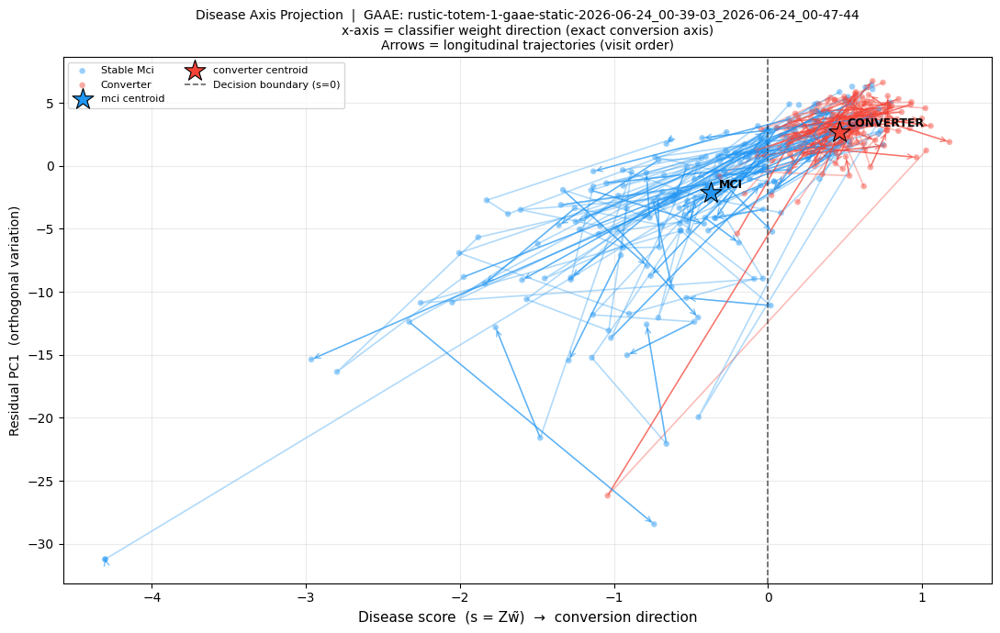

In [25]:
# ── Class centroids ──────────────────────────────────────────────────────
centroids = {}
for diag, label_val in [('mci', 0), ('converter', 1)]:
    m = (y_tv == label_val)
    centroids[diag] = (float(s[m].mean()), float(y_pc[m].mean()))

# ── Build per-subject visit sequences for trajectory plotting ─────────────
# Map scan_id → (disease_score, y_pc) for all train+val MCI scans
sid_to_xy = {}
for idx, (sid, s_val, y_val, lbl) in enumerate(zip(scan_tv, s, y_pc, labels_tv)):
    pid = str(sid).split('_')[0] if '_' in str(sid) else str(sid)
    sid_to_xy.setdefault(pid, []).append((s_val, y_val, lbl))

# ── Plot ──────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(11, 7))

palette_da = {'converter': '#F44336', 'mci': '#2196F3'}

# Scatter (all scans)
for diag, label_val in [('mci', 0), ('converter', 1)]:
    m = (y_tv == label_val)
    ax.scatter(s[m], y_pc[m], c=palette_da[diag], alpha=0.45, s=22,
               edgecolors='none', label=diag.replace('mci','Stable MCI').title(),
               zorder=2)

# Longitudinal trajectories for BOTH cohorts (all multi-scan subjects)
for pid, visits in sid_to_xy.items():
    if len(visits) < 2:
        continue
    xs = [v[0] for v in visits]
    ys = [v[1] for v in visits]
    lbl = visits[0][2]
    col = palette_da.get(lbl, '#9E9E9E')
    ax.plot(xs, ys, color=col, alpha=0.35, lw=1.2, zorder=1)
    # Arrow from first to last visit
    ax.annotate('', xy=(xs[-1], ys[-1]), xytext=(xs[-2], ys[-2]),
                arrowprops=dict(arrowstyle='->', color=col, lw=1.0, alpha=0.6))

# Centroids
for diag, (cx, cy) in centroids.items():
    ax.scatter(cx, cy, marker='*', s=300,
               c=palette_da[diag], edgecolors='black', linewidths=0.8,
               zorder=5, label=f'{diag} centroid')
    ax.annotate(diag.upper(), (cx, cy),
                textcoords='offset points', xytext=(6, 4), fontsize=9, fontweight='bold')

# Decision boundary
ax.axvline(0, color='black', lw=1.2, linestyle='--', alpha=0.6, label='Decision boundary (s=0)')

ax.set_xlabel('Disease score  (s = Zw̃)  →  conversion direction', fontsize=11)
ax.set_ylabel('Residual PC1  (orthogonal variation)', fontsize=10)
ax.set_title(
    f'Disease Axis Projection  |  GAAE: {SELECTED_NAME}\n'
    f'x-axis = classifier weight direction (exact conversion axis)\n'
    f'Arrows = longitudinal trajectories (visit order)',
    fontsize=10,
)
ax.legend(fontsize=8, ncol=2, loc='upper left')
ax.grid(alpha=0.25)
plt.tight_layout()
plt.show()


## Disease Axis Steering — Decoder Probe Along `w_hat`

Since subject-to-subject z-interpolation is non-functional (decoder ignores `z_nodes`), we use the **disease axis steering** approach:

1. Encode one MCI subject to get per-node embeddings `z_nodes ∈ R^{N×64}`
2. Add `scale × w_hat` to every node's embedding (steer along the LR disease direction)
3. Decode and observe whether the reconstructed FC changes

This is equivalent to Goodfire's *steering vector* experiment. If changes appear here but not in the α-interpolation, it confirms the encoder has learned the disease direction but the decoder is edge-attr-dominated.

> **Note**: because the decoder routes heavily through `edge_attr`, we also visualize the **difference** `FC(steered) - FC(baseline)` with its own colour scale, as absolute values may remain small.

In [26]:
# Encode one MCI baseline scan → per-node latent embeddings
model.eval()

# Use the first shared visit of the MCI subject as the probe point
g_probe = load_graph(mci_files[SHARED_VISITS[0]])
with torch.no_grad():
    z_probe_full = model.encode(
        g_probe.x.to(device),
        g_probe.edge_index.to(device),
        g_probe.edge_attr.to(device) if g_probe.edge_attr is not None else None,
    )   # (N_nodes, gaae_latent)
    fc_baseline = model.decode_features(
        z_probe_full,
        g_probe.edge_index.to(device),
        g_probe.edge_attr.to(device) if g_probe.edge_attr is not None else None,
    ).cpu().numpy()   # (N_nodes, 200)

# Disease direction vector from logistic regression
w_tensor  = torch.tensor(w_hat.astype(np.float32), dtype=torch.float32, device=device)  # (64,)
sigma_emb = float(embeddings.std())   # scaling: 1 unit = 1 std of latent space

# Steer from -3σ to +3σ along w_hat
STEER_STEPS = 11
scales = np.linspace(-3, 3, STEER_STEPS)    # in std-dev units

steered_fcs = []
with torch.no_grad():
    for scale in scales:
        shift        = float(scale * sigma_emb) * w_tensor.unsqueeze(0)   # (1, 64)
        z_steered    = z_probe_full + shift                                # (N, 64)
        fc_steered   = model.decode_features(
            z_steered,
            g_probe.edge_index.to(device),
            g_probe.edge_attr.to(device) if g_probe.edge_attr is not None else None,
        ).cpu().numpy()
        steered_fcs.append(fc_steered)

# Diagnostic norms
print('Steered reconstruction sensitivity:')
print(f'{"Scale":>8}  {"‖FC(steered)−FC(base)‖":>24}  {"Relative":>10}')
print('-' * 50)
for scale, fc_s in zip(scales, steered_fcs):
    diff = np.linalg.norm(fc_s - fc_baseline)
    rel  = diff / (np.linalg.norm(fc_baseline) + 1e-8)
    print(f'{scale:>+8.2f}σ  {diff:>24.4f}  {rel:>9.3%}')


Steered reconstruction sensitivity:
   Scale    ‖FC(steered)−FC(base)‖    Relative
--------------------------------------------------
   -3.00σ                   23.7493    59.679%
   -2.40σ                   19.9793    50.205%
   -1.80σ                   15.7094    39.476%
   -1.20σ                   10.8919    27.370%
   -0.60σ                    5.6220    14.127%
   +0.00σ                    0.0000     0.000%
   +0.60σ                    5.7646    14.486%
   +1.20σ                   11.5708    29.076%
   +1.80σ                   17.4008    43.726%
   +2.40σ                   23.1982    58.294%
   +3.00σ                   28.9869    72.840%


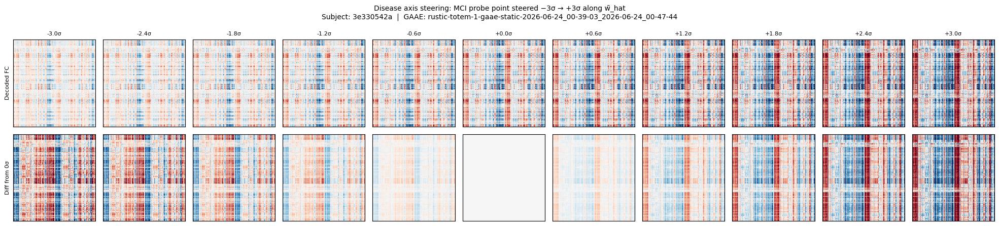

In [27]:
# ── Plot: 2-row grid (absolute FC + difference from baseline) ───────────
fig, axes = plt.subplots(2, STEER_STEPS, figsize=(STEER_STEPS * 1.8, 4.5))

# Global colour scale for absolute FC
all_fc_vals = np.concatenate([fc.ravel() for fc in steered_fcs])
v_abs = np.nanpercentile(np.abs(all_fc_vals), 97)

# Shared diff scale
diff_vals = np.concatenate([(fc - fc_baseline).ravel() for fc in steered_fcs])
v_diff = max(np.nanpercentile(np.abs(diff_vals), 97), 1e-6)

for ai, (scale, fc_s) in enumerate(zip(scales, steered_fcs)):
    # Row 0: absolute FC
    axes[0][ai].imshow(fc_s, cmap='RdBu_r', vmin=-v_abs, vmax=v_abs, aspect='auto')
    axes[0][ai].set_xticks([]); axes[0][ai].set_yticks([])
    axes[0][ai].set_title(f'{scale:+.1f}σ', fontsize=8)

    # Row 1: difference from baseline
    diff = fc_s - fc_baseline
    axes[1][ai].imshow(diff, cmap='RdBu_r', vmin=-v_diff, vmax=v_diff, aspect='auto')
    axes[1][ai].set_xticks([]); axes[1][ai].set_yticks([])

axes[0][0].set_ylabel('Decoded FC', fontsize=8, rotation=90)
axes[1][0].set_ylabel('Diff from 0σ', fontsize=8, rotation=90)

fig.suptitle(
    f'Disease axis steering: MCI probe point steered −3σ → +3σ along w̃_hat\n'
    f'Subject: {MCI_PID}  |  GAAE: {SELECTED_NAME}',
    fontsize=10,
)
plt.tight_layout()
plt.show()


## Option B — Subjects Sorted by Disease Score

Instead of interpolating between two specific subjects (which requires the decoder to respond to z), this visualization sorts **real subjects** by their disease score `s = Z @ w̃` and shows their reconstructed FC matrices in that order.

This is scientifically stronger: it shows that the disease score monotonically predicts a specific FC pattern across the **natural distribution** of real subjects — not in a constructed interpolation.

In [28]:
# ── Collect baseline scans for all train+val MCI+converter subjects ─────
# We need (subject_id, disease_score, filepath_of_baseline_scan)
import glob as _glob, re as _re

def _find_baseline(pid):
    """Return filepath of the earliest visit (M0 if exists, else min month)."""
    suffix = {
        'z_transformed': '_whole_brain_correlation_matrix_z_transformed.npz',
        'raw':           '_whole_brain_correlation_matrix.npz',
    }.get(FILE_VARIANT, '_whole_brain_correlation_matrix_z_transformed.npz')
    pat = os.path.join(WB_DATA_ROOT, f'sub-{pid}_*{suffix}')
    files = _glob.glob(pat)
    if not files:
        return None
    def _month(f):
        m = _re.search(r'_(M\d+)_', os.path.basename(f))
        return int(m.group(1).replace('M','')) if m else 999
    return sorted(files, key=_month)[0]

# Build (pid, disease_score) using s values from disease axis
# s is indexed over train+val MCI scans; groups_bin[tv_mask] are subject IDs per scan
pid_score = {}
for pid, s_val, lbl in zip(scan_tv, s, labels_tv):
    # Take the minimum disease score per subject (most MCI-like visit as baseline proxy)
    pid_str = str(pid)
    if pid_str not in pid_score:
        pid_score[pid_str] = {'scores': [], 'label': lbl}
    pid_score[pid_str]['scores'].append(float(s_val))

# Compute mean disease score per subject
sorted_subjects = sorted(
    [(pid, np.mean(info['scores']), info['label']) for pid, info in pid_score.items()],
    key=lambda x: x[1],   # ascending disease score
)

print(f'Total subjects with disease scores: {len(sorted_subjects)}')
print(f'Score range: [{sorted_subjects[0][1]:.3f}, {sorted_subjects[-1][1]:.3f}]')
print(f'Converters in top half: '
      f'{sum(1 for _,_,l in sorted_subjects[len(sorted_subjects)//2:] if l=="converter")}')


Total subjects with disease scores: 133
Score range: [-2.922, 0.935]
Converters in top half: 47


In [29]:
# ── Select N_SHOW subjects spanning the disease score range ─────────────
N_SHOW = 10   # subjects to visualize

# Evenly sample N_SHOW subjects across the full disease score range
indices = np.linspace(0, len(sorted_subjects) - 1, N_SHOW, dtype=int)
selected = [sorted_subjects[i] for i in indices]

# Load and decode baseline scan for each selected subject
sort_fcs_recon = []
sort_fcs_gt    = []
sort_labels    = []
sort_scores    = []

model.eval()
with torch.no_grad():
    for pid, score, label in selected:
        fpath = _find_baseline(pid)
        if fpath is None:
            print(f'  No file for {pid}, skipping.')
            continue
        g = load_graph(fpath)
        ei = g.edge_index.to(device)
        ea = g.edge_attr.to(device) if g.edge_attr is not None else None

        z = model.encode(g.x.to(device), ei, ea)   # (N, F)
        fc_recon = model.decode_features(z, ei, ea).cpu().numpy()
        fc_gt    = g.x.cpu().numpy()               # original FC matrix

        sort_fcs_recon.append(fc_recon)
        sort_fcs_gt.append(fc_gt)
        sort_labels.append(label)
        sort_scores.append(score)

print(f'Loaded {len(sort_fcs_recon)} subjects.')
print('Disease scores:', [f'{s:.2f}' for s in sort_scores])


Loaded 10 subjects.
Disease scores: ['-2.92', '-0.67', '-0.31', '-0.01', '0.15', '0.32', '0.41', '0.50', '0.60', '0.94']


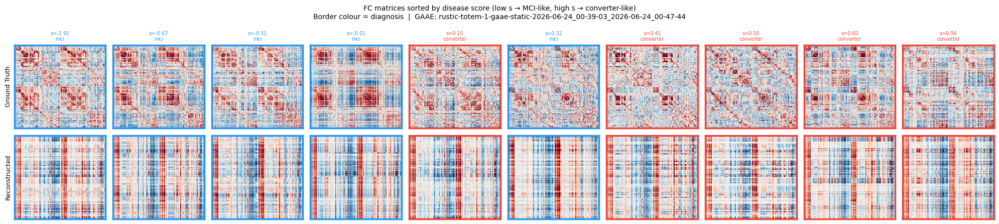

In [30]:
# ── Plot: 2 rows (Ground Truth | Reconstruction), N_SHOW columns sorted by s ─
fig, axes = plt.subplots(2, len(sort_fcs_recon), figsize=(len(sort_fcs_recon) * 2.0, 4.5))
if len(sort_fcs_recon) == 1:
    axes = [[axes[0]], [axes[1]]]

diag_colors = {'converter': '#F44336', 'mci': '#2196F3'}

for col_i, (fc_gt, fc_rec, lbl, score) in enumerate(
    zip(sort_fcs_gt, sort_fcs_recon, sort_labels, sort_scores)
):
    v_gt  = np.nanpercentile(np.abs(fc_gt),  97)
    v_rec = np.nanpercentile(np.abs(fc_rec), 97)

    axes[0][col_i].imshow(fc_gt,  cmap='RdBu_r', vmin=-v_gt,  vmax=v_gt,  aspect='auto')
    axes[1][col_i].imshow(fc_rec, cmap='RdBu_r', vmin=-v_rec, vmax=v_rec, aspect='auto')

    for row in [0, 1]:
        axes[row][col_i].set_xticks([]); axes[row][col_i].set_yticks([])
        for spine in axes[row][col_i].spines.values():
            spine.set_edgecolor(diag_colors.get(lbl, '#888'))
            spine.set_linewidth(2.5)

    axes[0][col_i].set_title(f's={score:.2f}\n{lbl}', fontsize=7,
                              color=diag_colors.get(lbl, '#888'))

axes[0][0].set_ylabel('Ground Truth', fontsize=9, rotation=90)
axes[1][0].set_ylabel('Reconstructed', fontsize=9, rotation=90)

fig.suptitle(
    f'FC matrices sorted by disease score (low s → MCI-like, high s → converter-like)\n'
    f'Border colour = diagnosis  |  GAAE: {SELECTED_NAME}',
    fontsize=10,
)
plt.tight_layout()
plt.show()


## Interactive 3D Visualizations (Plotly)

Plotly renders directly in Jupyter — zoom, rotate, and hover over individual scans. Two views are provided:

1. **3D Supervised UMAP** — global manifold structure with class guidance
2. **Disease Axis + Residual PCA (3D)** — the principal thesis figure: x=conversion direction, y/z=orthogonal variation, with per-subject temporal trajectories

> Install if needed: `pip install plotly`

In [31]:
try:
    import plotly.graph_objects as go
    import plotly.io as pio
    pio.renderers.default = 'notebook'
    print('plotly available ✓')
except ImportError:
    raise ImportError('Run: pip install plotly')


plotly available ✓


### 3D Unsupervised UMAP

UMAP with 3 components — class labels are **not** used during fitting, preserving the unsupervised manifold structure. Hover tooltips show subject ID and diagnosis.

In [32]:
try:
    import umap as umap_lib
except ImportError:
    raise ImportError('Run: pip install umap-learn')

# Supervised 3D UMAP on train+val MCI pool (no test leakage)
reducer_3d = umap_lib.UMAP(
    n_components=3, n_neighbors=15, min_dist=0.1,
    random_state=42, metric='euclidean',
)
emb_3d = reducer_3d.fit_transform(X_tv)          # unsupervised — no label guidance   # shape (N, 3)

PALETTE_3D = {0: '#2196F3', 1: '#F44336'}
LABEL_3D   = {0: 'Stable MCI', 1: 'Converter'}

# Build hover text (subject ID + visit index from scan_tv)
hover_tv = []
for i, pid in enumerate(scan_tv):
    hover_tv.append(f'Subject: {pid}<br>Diagnosis: {labels_tv[i]}')

fig_umap3d = go.Figure()
for lv in [0, 1]:
    m = (y_tv == lv)
    fig_umap3d.add_trace(go.Scatter3d(
        x=emb_3d[m, 0], y=emb_3d[m, 1], z=emb_3d[m, 2],
        mode='markers',
        marker=dict(size=4, color=PALETTE_3D[lv], opacity=0.75),
        name=LABEL_3D[lv],
        text=[hover_tv[i] for i in range(len(y_tv)) if y_tv[i] == lv],
        hovertemplate='%{text}<extra></extra>',
    ))

fig_umap3d.update_layout(
    title=dict(
        text=f'GAAE Latent Space — 3D Unsupervised UMAP<br>'
             f'<sup>Checkpoint: {SELECTED_NAME}</sup>',
        font=dict(size=14),
    ),
    scene=dict(
        xaxis_title='UMAP 1', yaxis_title='UMAP 2', zaxis_title='UMAP 3',
        bgcolor='rgb(15,15,25)',
        xaxis=dict(gridcolor='#333'), yaxis=dict(gridcolor='#333'), zaxis=dict(gridcolor='#333'),
    ),
    paper_bgcolor='rgb(15,15,25)', plot_bgcolor='rgb(15,15,25)',
    font=dict(color='white'),
    legend=dict(title='Diagnosis', font=dict(size=11)),
    width=800, height=600,
)
fig_umap3d.show()


/mnt/e/fyassine/ad-early-detection/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### Disease Axis + Residual PCA — 3D (Principal Thesis Figure)

**x-axis** = disease score `s = Z @ w̃` (the exact conversion direction from the classifier)

**y, z-axes** = top-2 PCs of residual variation orthogonal to the disease axis

Lines connect each subject's visits in chronological order — you can observe individual disease trajectories navigating the latent manifold.

In [33]:
from sklearn.decomposition import PCA

# Compute 2 residual PCs (extend disease-axis-fit which only computed 1)
pca_res2 = PCA(n_components=2, random_state=42)
R_tv      = Z_std - np.outer(s, w_hat)   # residuals (N, 64)
pca2_coords = pca_res2.fit_transform(R_tv)   # (N, 2)

# Build per-scan DataFrame with coordinates
import pandas as pd
_coords_df = pd.DataFrame({
    'pid':   scan_tv,
    'diag':  labels_tv,
    'score': s,
    'pc1':   pca2_coords[:, 0],
    'pc2':   pca2_coords[:, 1],
})
# Sort within each subject by disease score as a visit-order proxy
# (visit_months not available at scan level here, use score rank)
_coords_df['visit_rank'] = _coords_df.groupby('pid')['score'].rank()
_coords_df = _coords_df.sort_values(['pid', 'visit_rank'])

print(f'Subjects in 3D plot: {_coords_df["pid"].nunique()}')
print(f'Scans: {len(_coords_df)}')


Subjects in 3D plot: 133
Scans: 408


In [34]:
PALETTE_DIAG = {'mci': '#2196F3', 'converter': '#F44336'}

fig_da3d = go.Figure()

# ── Scatter: all scans ─────────────────────────────────────────────────────
for diag in ['mci', 'converter']:
    sub = _coords_df[_coords_df['diag'] == diag]
    fig_da3d.add_trace(go.Scatter3d(
        x=sub['score'], y=sub['pc1'], z=sub['pc2'],
        mode='markers',
        marker=dict(size=4, color=PALETTE_DIAG[diag], opacity=0.7),
        name=diag.replace('mci', 'Stable MCI').title(),
        text=sub.apply(
            lambda r: f'ID: {r.pid}<br>s={r.score:.3f}<br>{r.diag}', axis=1
        ),
        hovertemplate='%{text}<extra></extra>',
    ))

# ── Class centroids ────────────────────────────────────────────────────────
for diag in ['mci', 'converter']:
    sub = _coords_df[_coords_df['diag'] == diag]
    fig_da3d.add_trace(go.Scatter3d(
        x=[sub['score'].mean()], y=[sub['pc1'].mean()], z=[sub['pc2'].mean()],
        mode='markers+text',
        marker=dict(size=12, color=PALETTE_DIAG[diag],
                    symbol='diamond', line=dict(color='white', width=1)),
        text=[diag.upper()], textposition='top center',
        name=f'{diag} centroid',
        showlegend=True,
    ))

# ── Longitudinal trajectories (per-subject lines) ──────────────────────────
for pid, grp in _coords_df.groupby('pid'):
    if len(grp) < 2:
        continue
    diag = grp['diag'].iloc[0]
    col  = PALETTE_DIAG.get(diag, '#888')
    fig_da3d.add_trace(go.Scatter3d(
        x=grp['score'], y=grp['pc1'], z=grp['pc2'],
        mode='lines',
        line=dict(color=col, width=2),
        opacity=0.35,
        showlegend=False,
        hoverinfo='skip',
    ))

# ── Decision boundary plane (s = 0) ───────────────────────────────────────
pc1_range = [float(_coords_df['pc1'].min()), float(_coords_df['pc1'].max())]
pc2_range = [float(_coords_df['pc2'].min()), float(_coords_df['pc2'].max())]
fig_da3d.add_trace(go.Surface(
    x=[[0, 0], [0, 0]],
    y=[pc1_range, pc1_range],
    z=[[pc2_range[0], pc2_range[1]], [pc2_range[0], pc2_range[1]]],
    opacity=0.15, colorscale=[[0,'grey'],[1,'grey']],
    showscale=False, name='Decision boundary (s=0)', showlegend=True,
))

fig_da3d.update_layout(
    title=dict(
        text=f'Disease Axis + Residual PCA — 3D Latent Space<br>'
             f'<sup>x = Conversion direction (LR steering vector) | '
             f'y,z = Residual PCA  |  GAAE: {SELECTED_NAME}</sup>',
        font=dict(size=13),
    ),
    scene=dict(
        xaxis_title='Disease Score (w̃ · z)',
        yaxis_title='Residual PC1',
        zaxis_title='Residual PC2',
        bgcolor='rgb(15,15,25)',
        xaxis=dict(gridcolor='#333'),
        yaxis=dict(gridcolor='#333'),
        zaxis=dict(gridcolor='#333'),
    ),
    paper_bgcolor='rgb(15,15,25)', plot_bgcolor='rgb(15,15,25)',
    font=dict(color='white'),
    legend=dict(title='Diagnosis / Centroid', font=dict(size=10)),
    width=900, height=650,
)
fig_da3d.show()
